# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [3]:
import utils
from PIL import Image
import io
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle
import seaborn as sns
from PIL import Image, ImageStat
%matplotlib inline


In [4]:
#dataset = get_dataset("/app/project/data/processed")
# I created my own function as the provided code was not working in my docker environment
dataset = utils.create_dataset("/app/project/data/processed/")

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [5]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    # ADD CODE HERE
    #for batch in dataset.map(decode_fn).take(10):
    # create colour code for the different objects
    colormap = {1: 'r', 2: 'g', 4: 'b'}

    #convert tfrecord into visible picture
    image = batch['image/encoded'].numpy()
    img = Image.open(io.BytesIO(image))

    #create a plot and add the bounding boxes
    fig, ax = plt.subplots(figsize=(21,12))
    width = batch['image/width'].numpy() 
    height = batch['image/height'].numpy()
    ax.imshow(img)
    for cl, xmin, xmax, ymin, ymax in zip(batch['image/object/class/label'].values.numpy(), 
    batch['image/object/bbox/xmin'].values.numpy() * width,
    batch['image/object/bbox/xmax'].values.numpy() * width, batch['image/object/bbox/ymin'].values.numpy() * height, 
    batch['image/object/bbox/ymax'].values.numpy() * height):
        rec = Rectangle((xmin, ymin), xmax- xmin, ymax-ymin, facecolor='none', 
                       edgecolor=colormap[cl])
        ax.add_patch(rec)
    plt.show()


## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

In [6]:
#get number of images
n_elements = len(list(dataset))
#n_elements = 20000 #it takes a few sec to compute the exact number so code commented

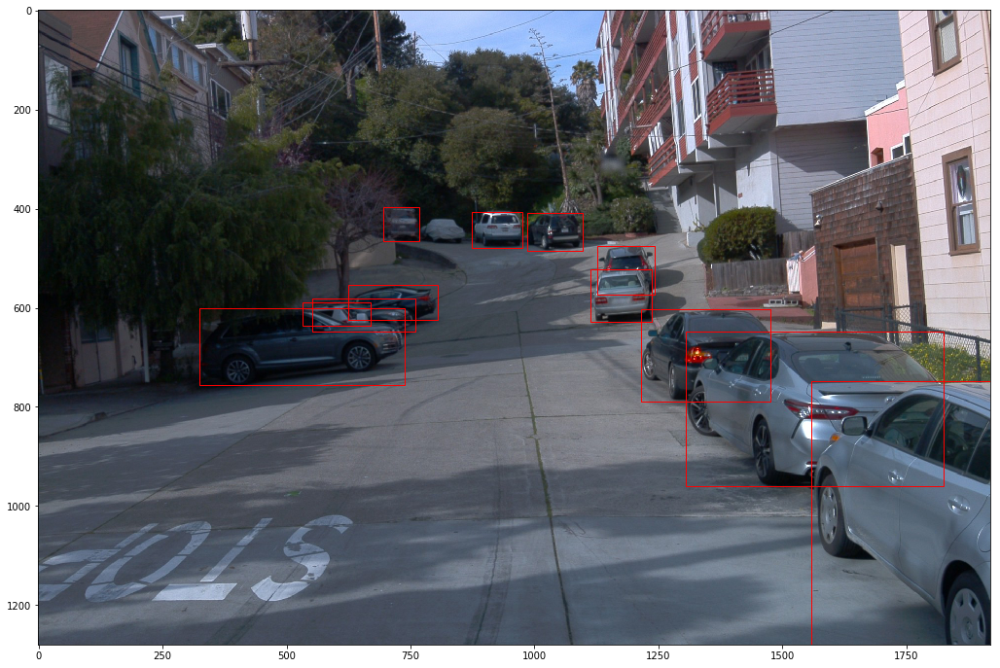

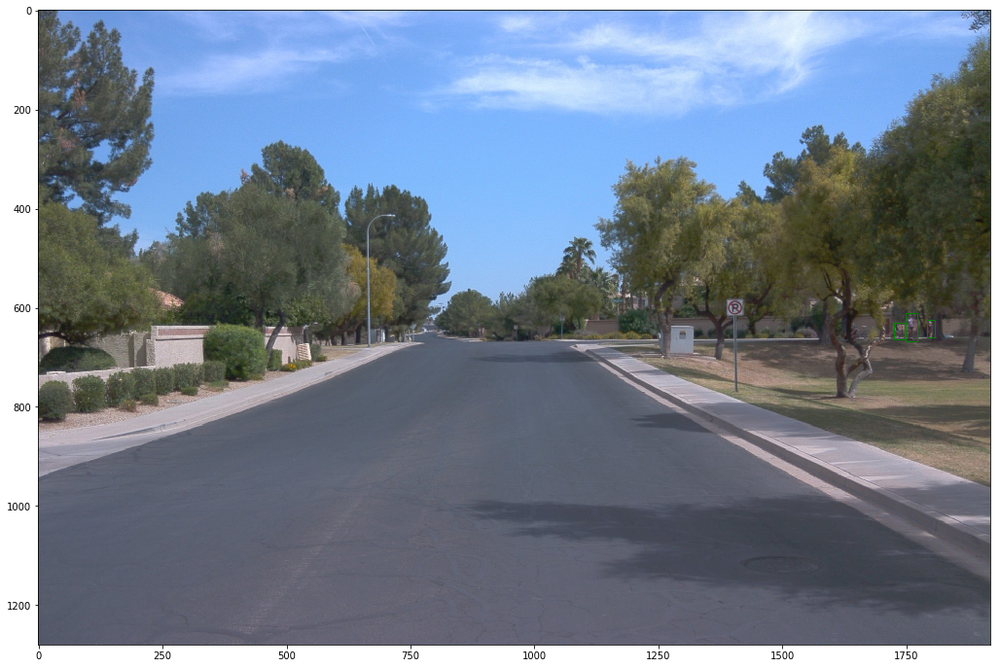

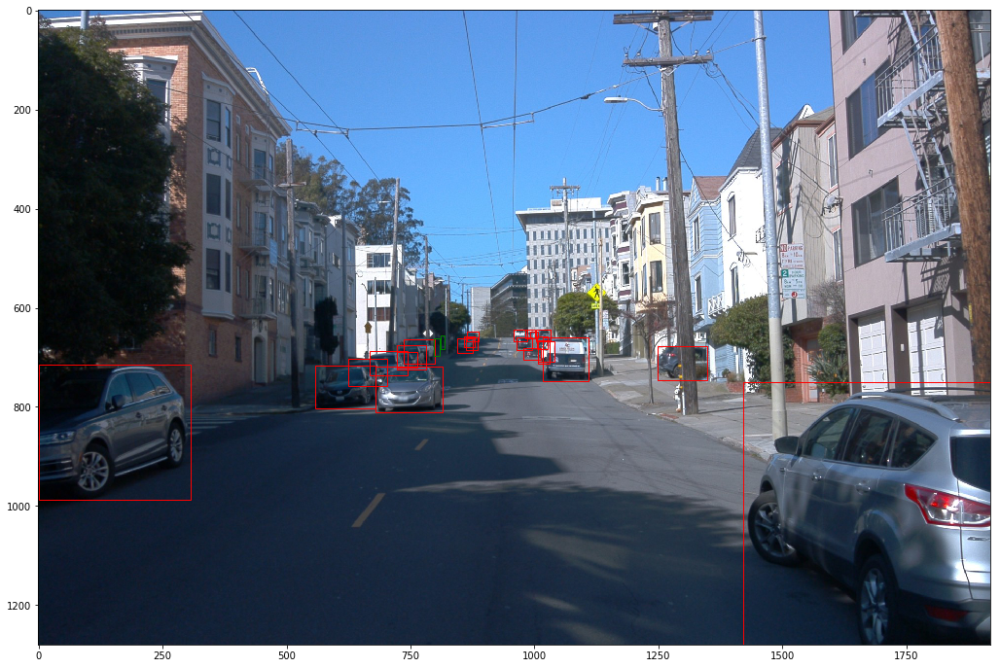

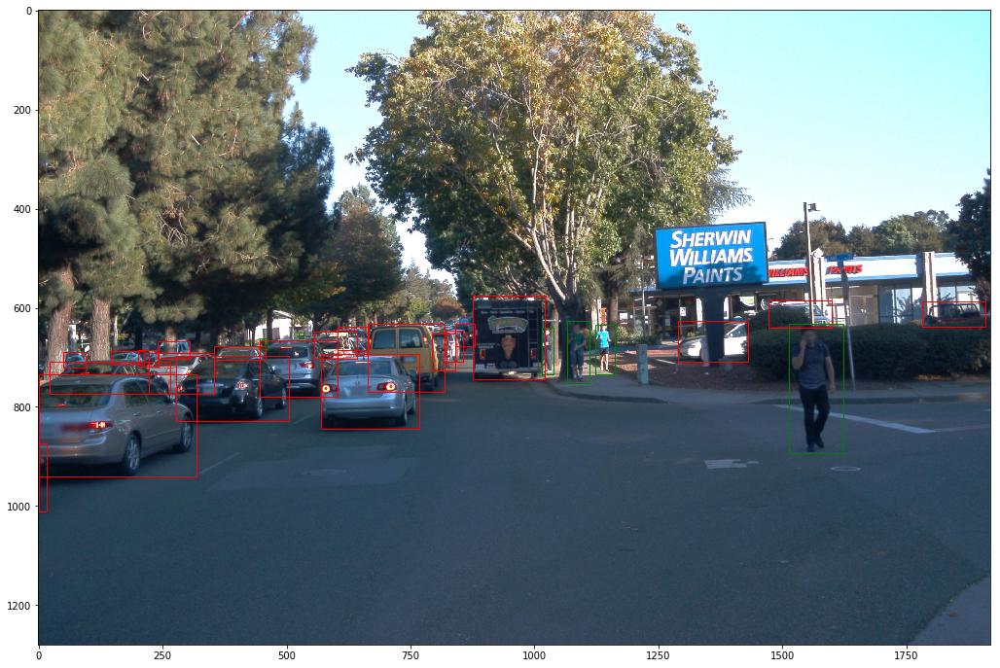

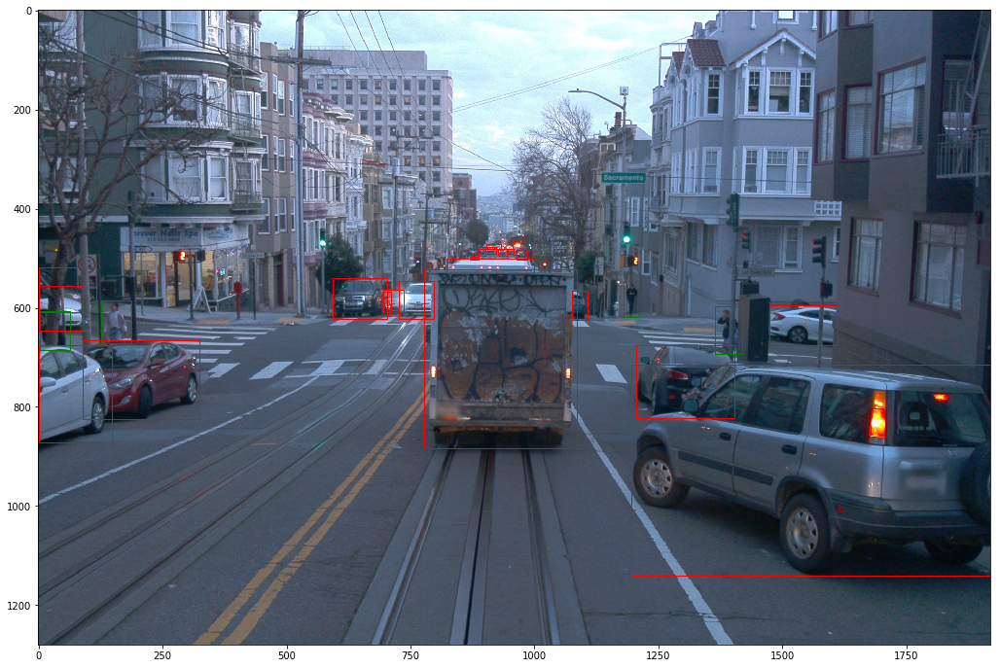

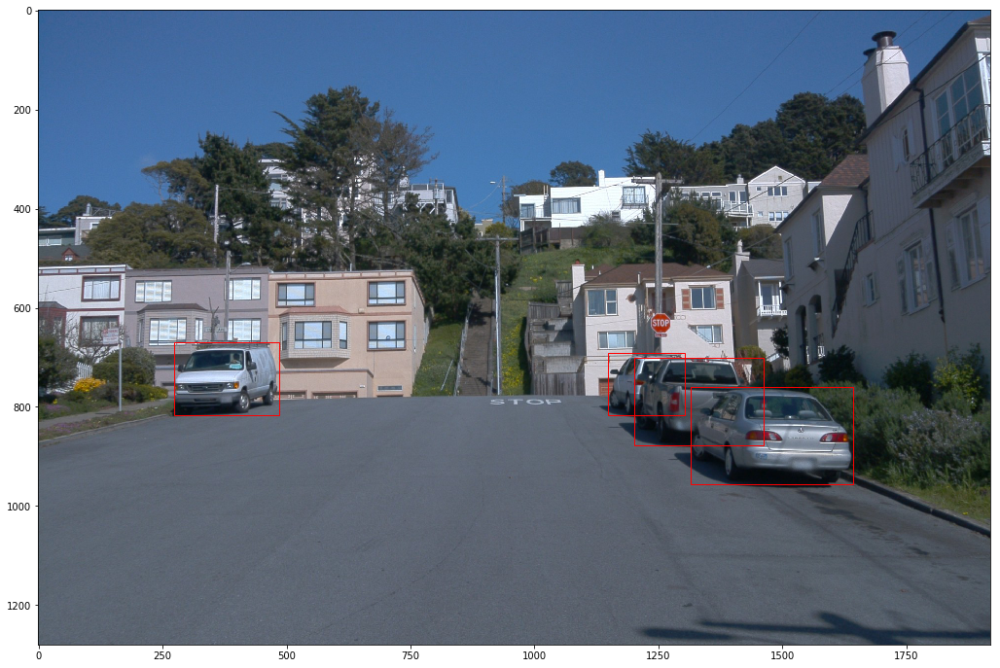

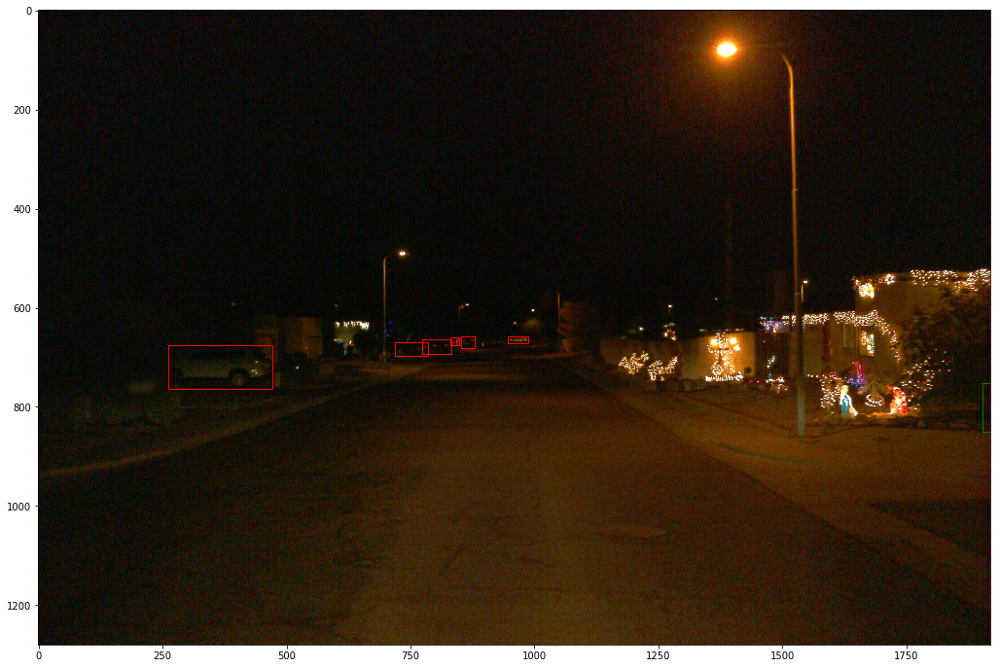

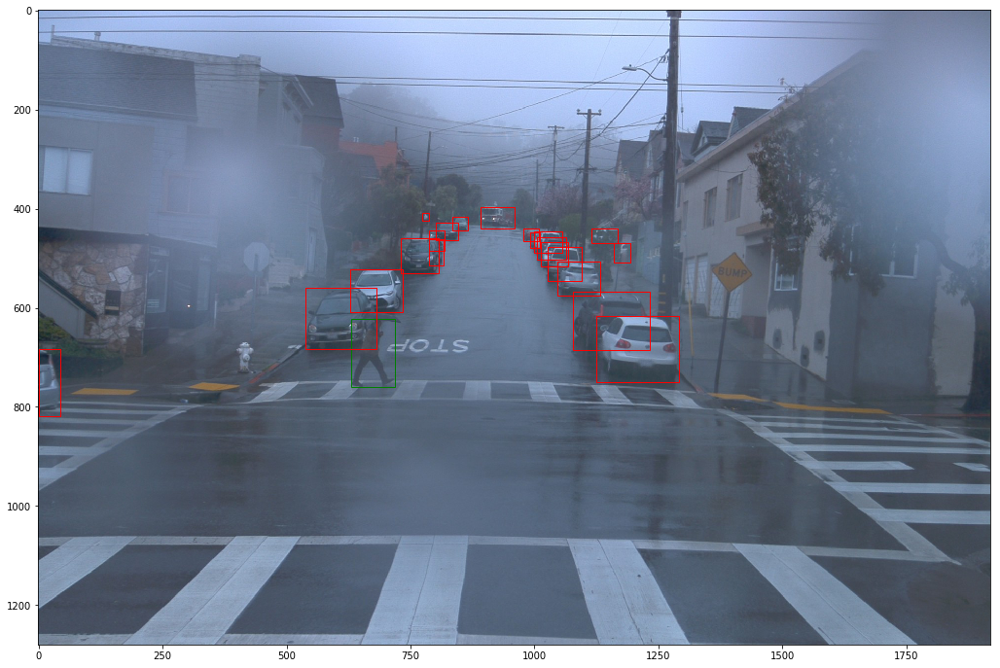

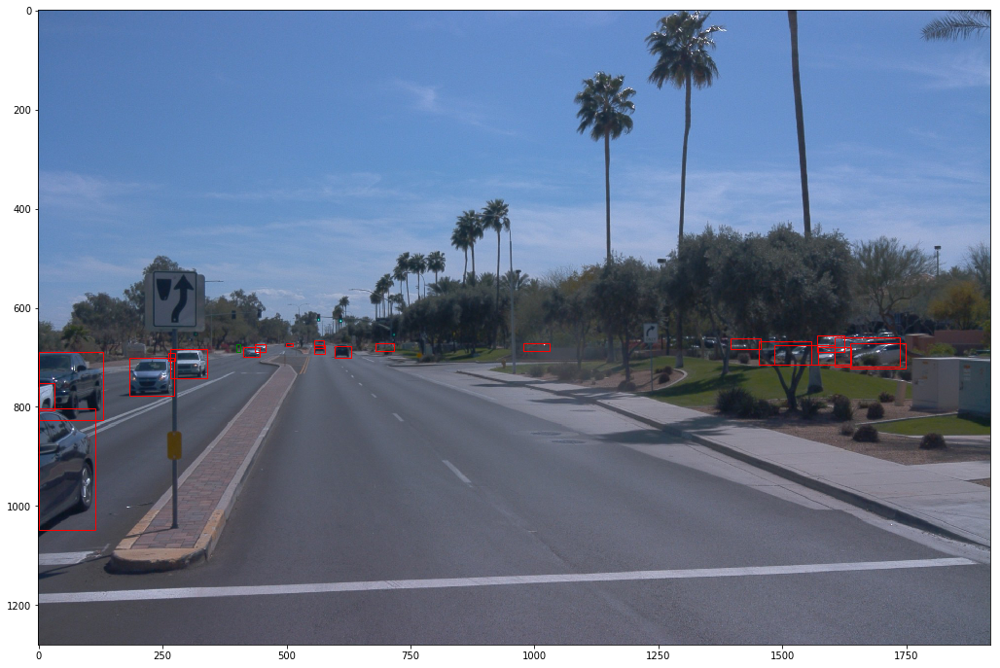

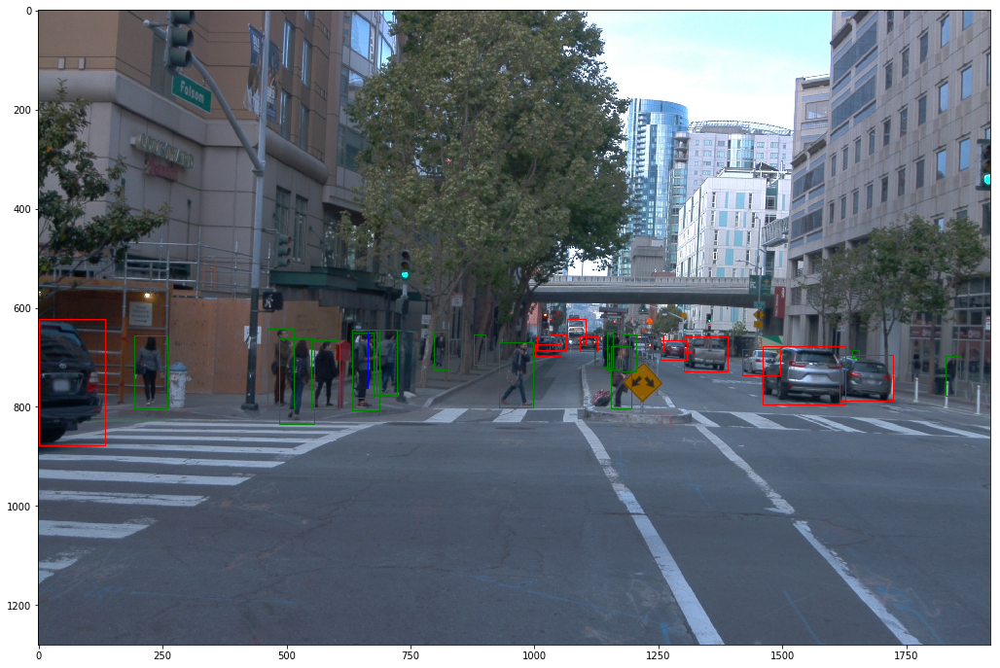

In [7]:
## STUDENT SOLUTION HERE
for batch in dataset.map(utils.decode_fn).shuffle(n_elements*2, reshuffle_each_iteration=True).take(10):
    display_instances(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

In [8]:
def calculate_mean_std_chan_histogram(tfrecord_Dataset):
    """
    calculate mean and std of image list and calculate channel wise pixel value
    args:
    - tfrecord_Dataset]: list of tfrecord.Dataset
    returns:
    - mean [array]: 1x3 array of float, channel wise mean
    - std [array]: 1x3 array of float, channel wise std
    
    """
    #code taken from lessons and adapted to input type
    means = []
    stds = []
    red = []
    green = []
    blue = []
    # extract information
    for batch in tfrecord_Dataset.map(utils.decode_fn).take(10):
        image = batch['image/encoded'].numpy()
        img = Image.open(io.BytesIO(image))
        stat = ImageStat.Stat(img)
        means.append(np.array(stat.mean))
        stds.append(np.array(stat.var)**0.5)

        img = np.array(Image.open(io.BytesIO(image)))
        R, G, B = img[..., 0], img[..., 1], img[..., 2]
        red.extend(R.flatten().tolist())
        green.extend(G.flatten().tolist())
        blue.extend(B.flatten().tolist())
    total_mean = np.mean(means, axis=0)
    total_std = np.mean(stds, axis=0)

    #provide information
    sns.kdeplot(red, color='r')
    sns.kdeplot(green, color='g')
    sns.kdeplot(blue, color='b')

    return total_mean, total_std

/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:1377: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_base.py:237: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_base.py:239: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]
/usr/local/lib/python3.6/dist-packages/matplotlib/cbook/__init__.py:1377: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed

The mean is [ 86.93529122 108.35847294 124.34454411].
The std is [42.55164663 48.39517626 55.23635283].


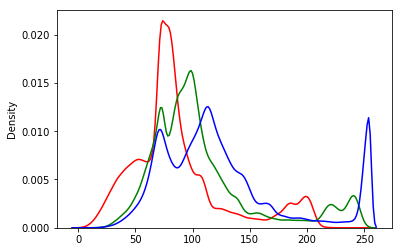

In [9]:
mean, std = calculate_mean_std_chan_histogram(dataset)
print("The mean is " + str(mean) + ".")
print("The std is " + str(std) + ".")

